# Lab1 数字图像空域增强实验
**Author: Gao Pengbing (nbgao)**  
**Email: nbgao@126.com**

# Work2 彩色图像的去噪
## Work2-P1
对一副彩色图像分别添加高斯噪声和椒盐噪声，输出结果图像

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import skimage
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

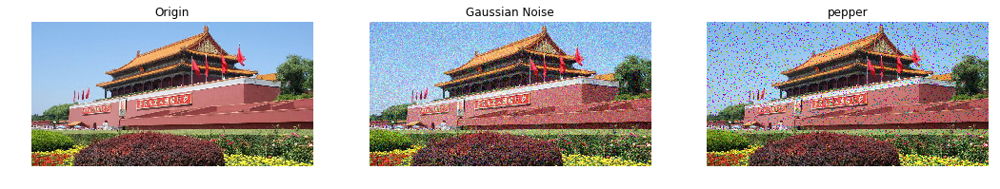

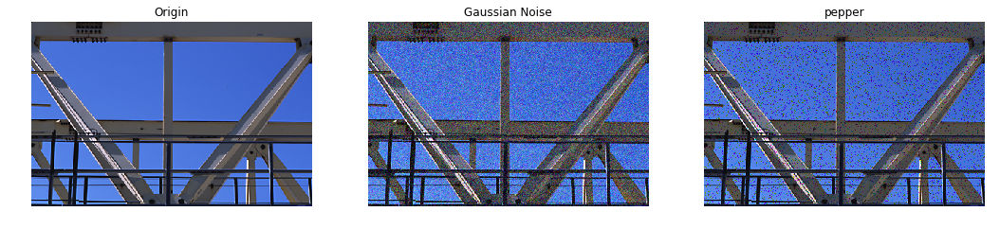

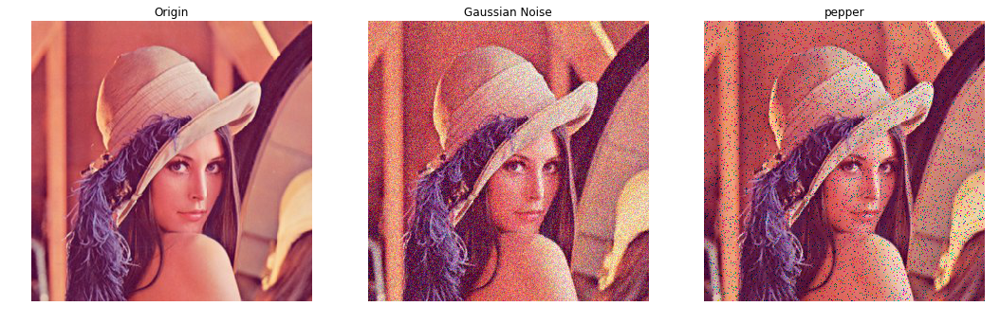

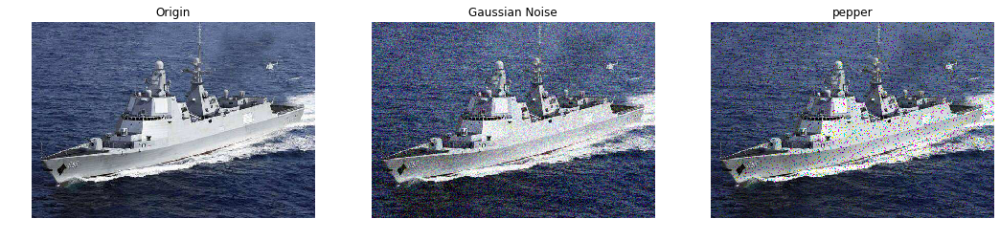

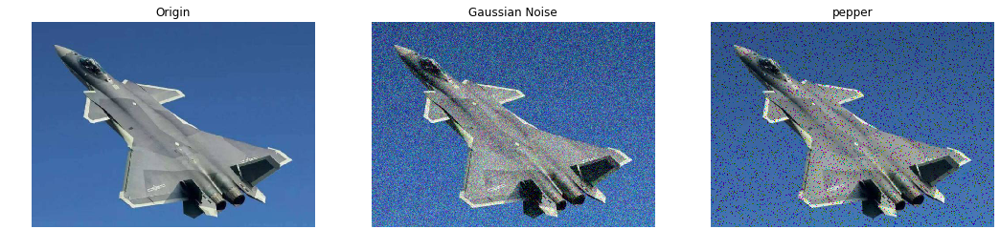

In [35]:
img = [_ for i in range(6)]
img_gaussian = [_ for i in range(6)]
img_pepper = [_ for i in range(6)]

for i in range(1,6):
    file_path = 'Image/image'+str(i)+'.jpg'
    img[i] = plt.imread(file_path)
    img_gaussian[i] = np.uint8(skimage.util.random_noise(img[i], mode='gaussian', var=0.01)*255)
    img_pepper[i] = np.uint8(skimage.util.random_noise(img[i], mode='pepper')*255)
    
    plt.figure(figsize=(18,6))
    plt.subplot(131)
    plt.imshow(img[i])
    plt.title('Origin')
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(img_gaussian[i])
    plt.title('Gaussian Noise')
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(img_pepper[i])
    plt.title('pepper')
    plt.axis('off')

    plt.show()

## Work2-P2
编写KNN均值滤波对二种噪声图像进行去噪，测试3组不同的参数，输出结果图像，并分析实验效果

### KNN均值滤波

In [42]:
def Nearest(arr, x, k):
    a = arr.copy()
#     a = np.delete(a, len(a)//2)
    n = len(a)
    d = np.zeros_like(a)
    for i in range(n):
        d[i] = abs(a[i]-x)
    # print(d)
    d_map = np.array(list(zip(a, d)))
    d_map = d_map[d_map[:,1].argsort()]
    a_k = d_map[:k, 0]
    p = np.uint8(np.mean(a_k))
    
#     p = np.uint8(np.mean(arr))
    return p

def KNN_AverageFilter(I, k):
    [h, w, C] = I.shape[:3]
    G = I.copy()
    L = 0
    if(k<=9):
        L = 1
    elif(k<=25):
        L = 2
    elif(k<=49):
        L = 3

    for i in range(L,h-L):
        for j in range(L,w-L):
            for c in range(C):
                T = I[i-L:i+L+1, j-L:j+L+1, c]
                G[i,j,c] = Nearest(T.ravel(), I[i,j,c], k)
    
    return G

#### KNN均值滤波器 — 高斯噪声

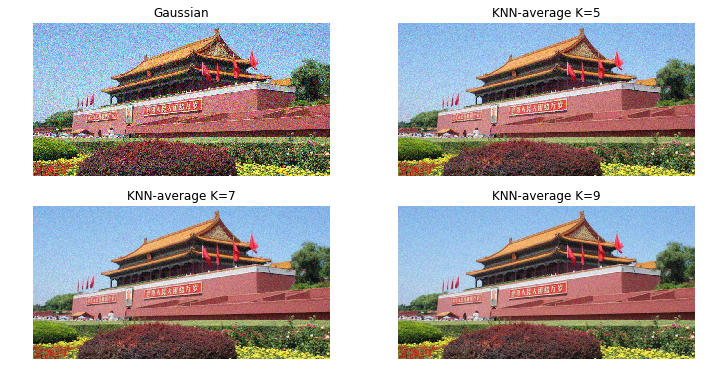

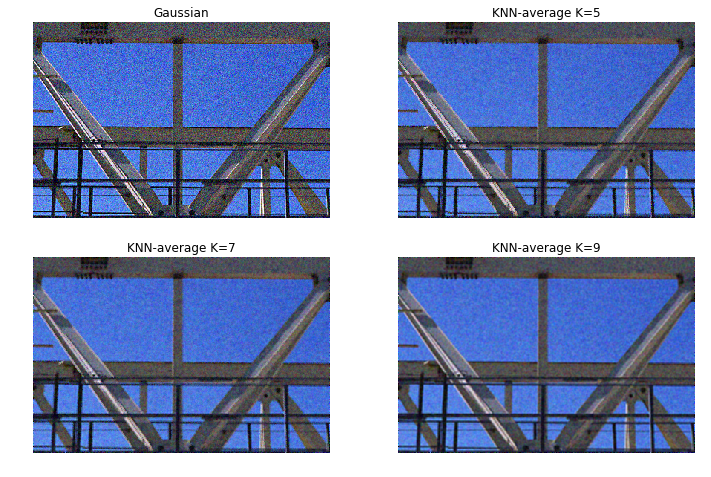

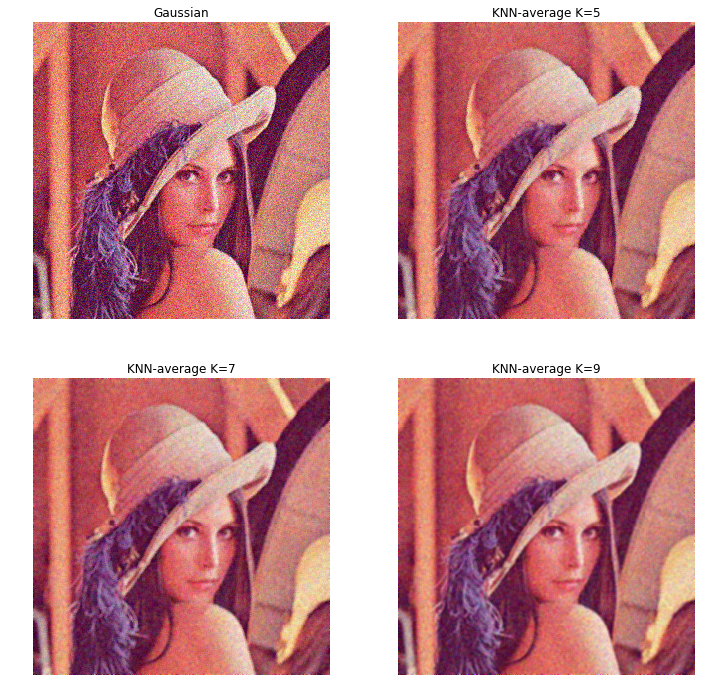

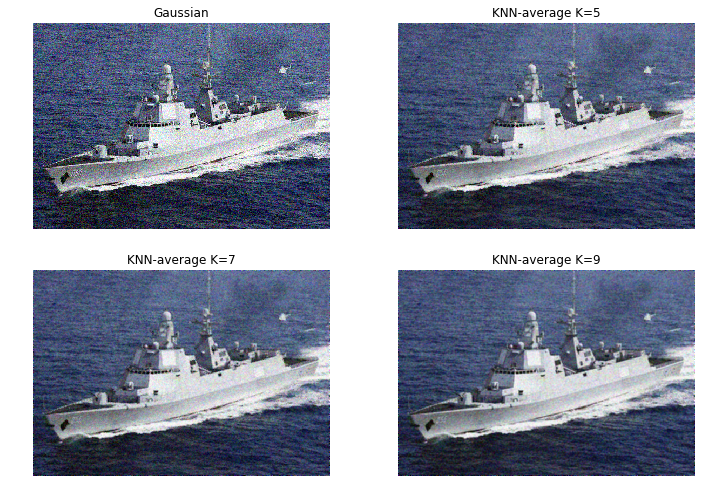

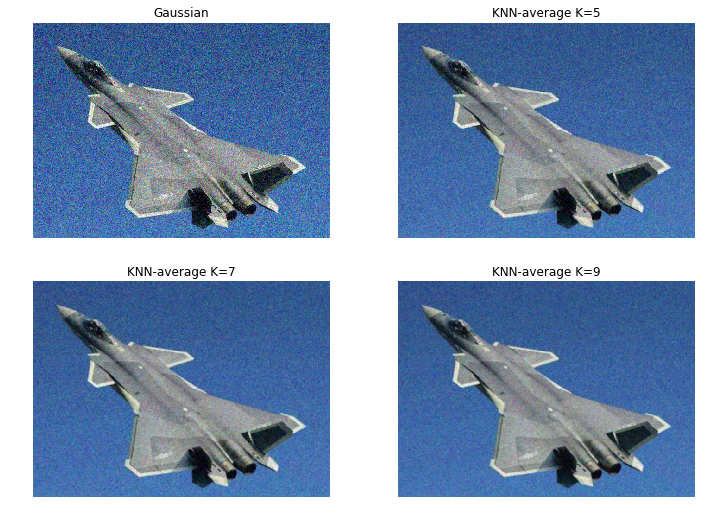

In [43]:
for i in range(1,6):
    gaussian_ave_5 = KNN_AverageFilter(img_gaussian[i], 5)
    gaussian_ave_7 = KNN_AverageFilter(img_gaussian[i], 7)
    gaussian_ave_9 = KNN_AverageFilter(img_gaussian[i], 9)
        
    plt.figure(figsize=(12, 12*img_gaussian[i].shape[0]/img_gaussian[i].shape[1]))
    plt.subplot(221)
    plt.imshow(img_gaussian[i])
    plt.title('Gaussian')
    plt.axis('off')

    plt.subplot(222)
    plt.imshow(gaussian_ave_5)
    plt.title('KNN-average K=5')
    plt.axis('off')

    plt.subplot(223)
    plt.imshow(gaussian_ave_7)
    plt.title('KNN-average K=7')
    plt.axis('off')

    plt.subplot(224)
    plt.imshow(gaussian_ave_9)
    plt.title('KNN-average K=9')
    plt.axis('off')

    plt.show()

#### KNN均值滤波器 — 椒盐噪声

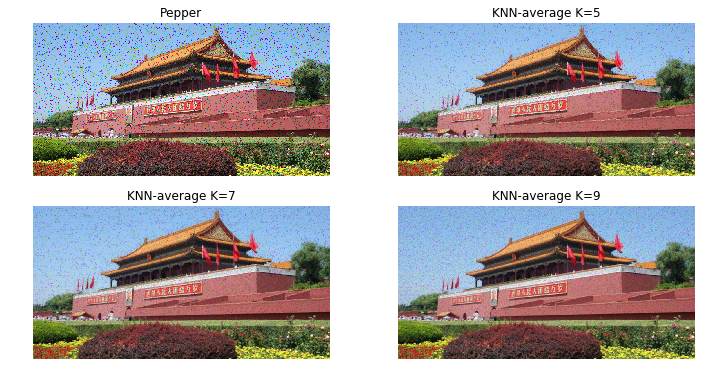

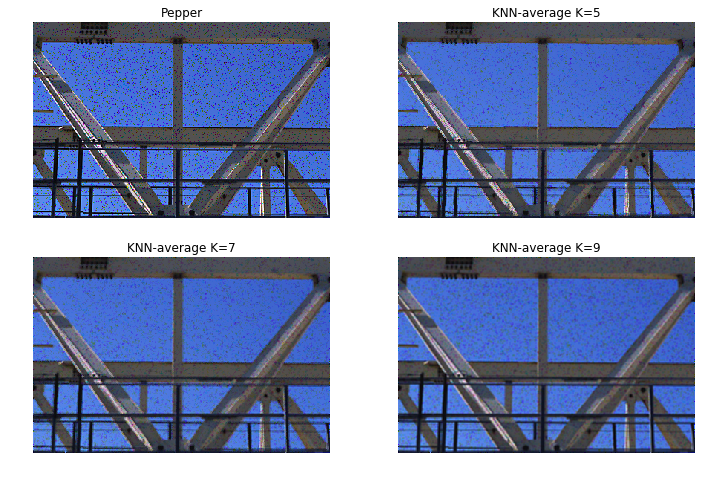

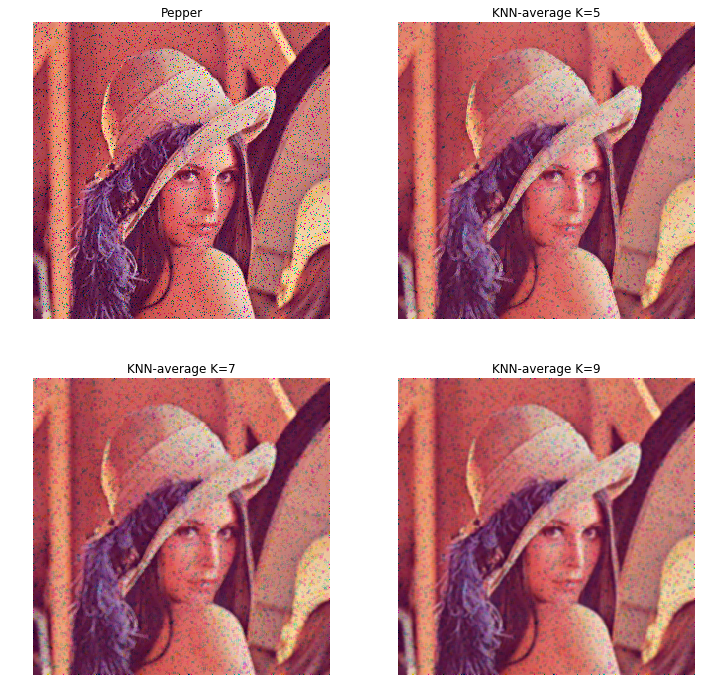

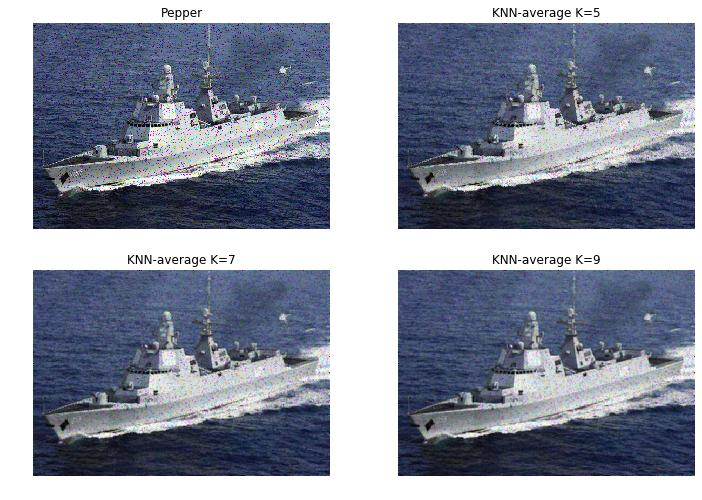

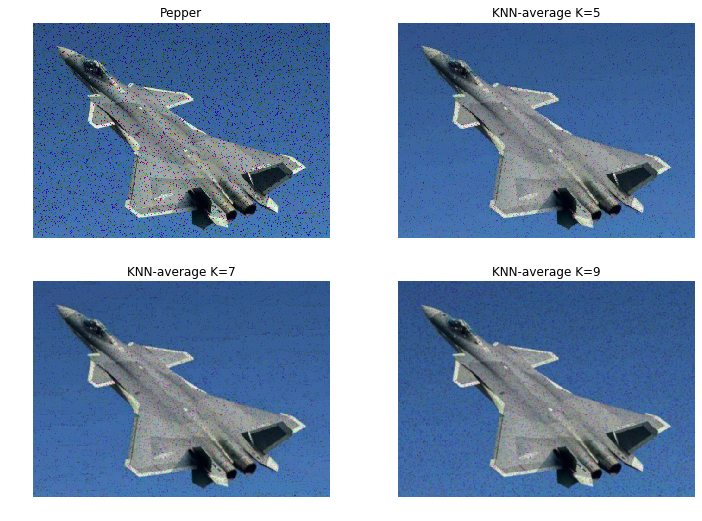

In [44]:
for i in range(1,6):
    pepper_ave_5 = KNN_AverageFilter(img_pepper[i], 5)
    pepper_ave_7 = KNN_AverageFilter(img_pepper[i], 7)
    pepper_ave_9 = KNN_AverageFilter(img_pepper[i], 9)
    
    plt.figure(figsize=(12, 12*img_pepper[i].shape[0]/img_pepper[i].shape[1]))
    plt.subplot(221)
    plt.imshow(img_pepper[i])
    plt.title('Pepper')
    plt.axis('off')

    plt.subplot(222)
    plt.imshow(pepper_ave_5)
    plt.title('KNN-average K=5')
    plt.axis('off')

    plt.subplot(223)
    plt.imshow(pepper_ave_7)
    plt.title('KNN-average K=7')
    plt.axis('off')

    plt.subplot(224)
    plt.imshow(pepper_ave_9)
    plt.title('KNN-average K=9')
    plt.axis('off')

    plt.show()

## Work2-P3
编写KNN中值滤波对二种噪声图像进行去噪，测试3组不同的参数，输出结果图像，并分析实验效果

### KNN中值滤波

In [55]:
def NearestMedian(arr, x, k):
#     a = arr.copy()
# #     a = np.delete(a, len(a)//2)
#     n = len(a)
#     d = np.zeros_like(a)
#     for i in range(n):
#         d[i] = abs(a[i]-x)
#     d_map = np.array(list(zip(a, d)))
#     d_map = d_map[d_map[:,1].argsort()]
#     a_k = d_map[:k, 0]
#     p = a_k[k//2]
    
    a = arr[arr[:].argsort()]
    p = a[len(a)//2]
    return p

def MedianFilter(I, k):
    [h, w, C] = I.shape[:3]
    G = I.copy()
    L = 0
    if(k<=9):
        L = 1
    elif(k<=25):
        L = 2
    elif(k<=49):
        L = 3

    for i in range(L,h-L):
        for j in range(L,w-L):
            for c in range(C):
                T = I[i-L:i+L+1, j-L:j+L+1, c]
                G[i,j,c] = NearestMedian(T.ravel(), I[i,j,c], k)
    
    return G

#### 中值滤波器 - 高斯噪声

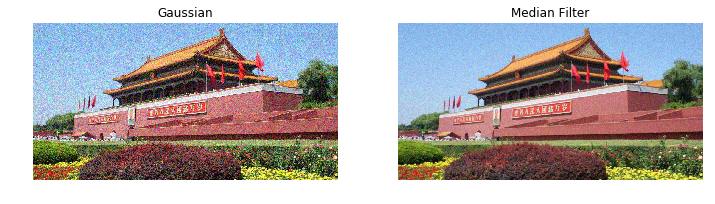

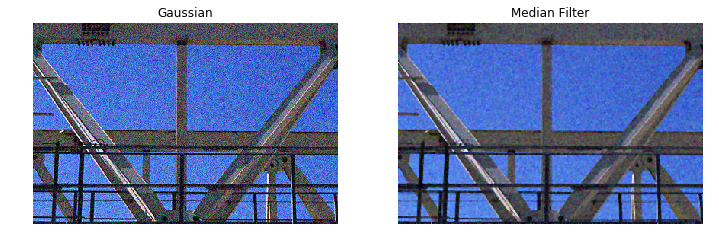

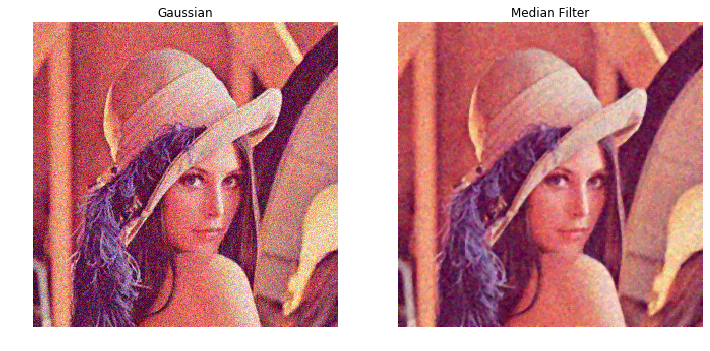

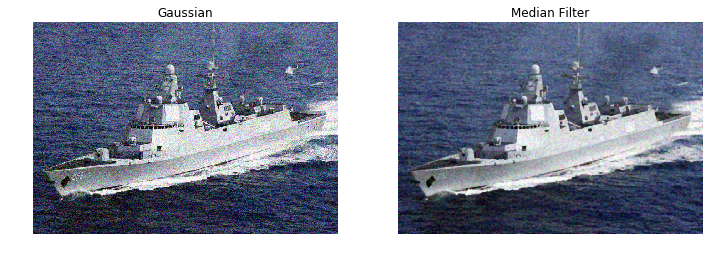

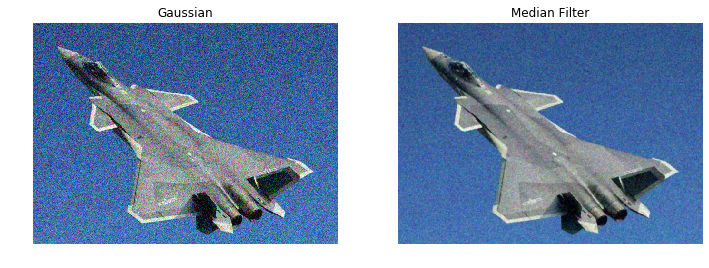

In [50]:
for i in range(1,6):
#     gaussian_med_5 = MedianFilter(img_gaussian[i], 5)
#     gaussian_med_7 = MedianFilter(img_gaussian[i], 7)
    gaussian_med_9 = MedianFilter(img_gaussian[i], 9)
    
    plt.figure(figsize=(12, 6*img_gaussian[i].shape[0]/img_gaussian[i].shape[1]))
    plt.subplot(121)
    plt.imshow(img_gaussian[i])
    plt.title('Gaussian')
    plt.axis('off')

    plt.subplot(122)
    plt.imshow(gaussian_med_9)
    plt.title('Median Filter')
    plt.axis('off')

#     plt.subplot(223)
#     plt.imshow(gaussian_med_5)
#     plt.title('Median K=5')
#     plt.axis('off')

#     plt.subplot(224)
#     plt.imshow(gaussian_med_7)
#     plt.title('Median K=7')
#     plt.axis('off')

    plt.show()

#### KNN中值滤波器 - 椒盐噪声

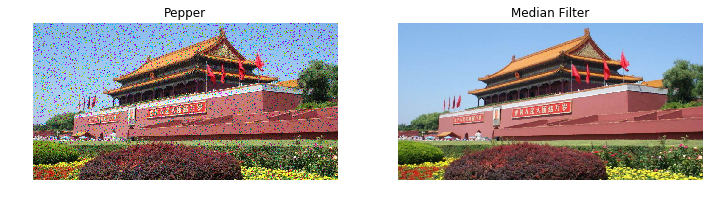

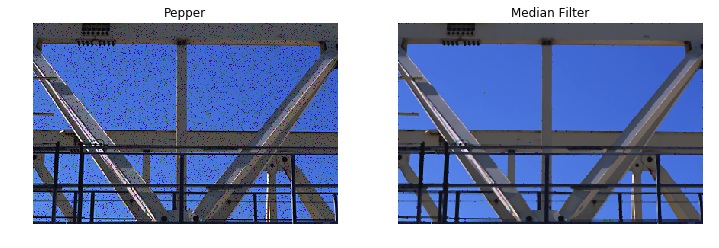

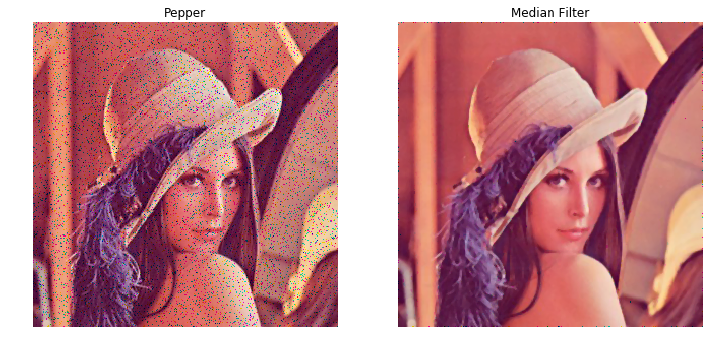

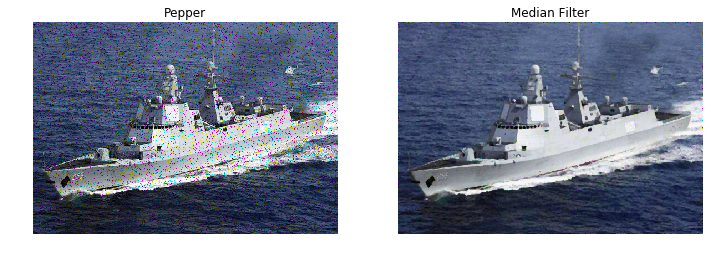

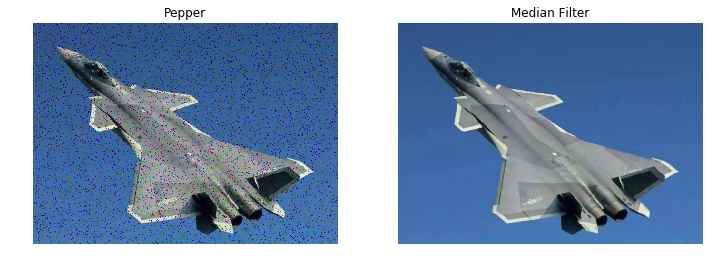

In [56]:
for i in range(1,6):
#     pepper_med_5 = MedianFilter(img_pepper[i], 5)
#     pepper_med_7 = MedianFilter(img_pepper[i], 7)
    pepper_med_9 = MedianFilter(img_pepper[i], 9)
    
    plt.figure(figsize=(12, 6*img_pepper[i].shape[0]/img_pepper[i].shape[1]))
    plt.subplot(121)
    plt.imshow(img_pepper[i])
    plt.title('Pepper')
    plt.axis('off')

    plt.subplot(122)
    plt.imshow(pepper_med_9)
    plt.title('Median Filter')
    plt.axis('off')

#     plt.subplot(223)
#     plt.imshow(pepper_med_5)
#     plt.title('Median K=5')
#     plt.axis('off')

#     plt.subplot(224)
#     plt.imshow(pepper_med_7)
#     plt.title('Median K=7')
#     plt.axis('off')

    plt.show()